In [9]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17483, done.
remote: Counting objects: 100% (109/109), done.
remote: Compressing objects: 100% (79/79), done.
remote: Total 17483 (delta 79), reused 30 (delta 30), pack-reused 17374 (from 4)
Receiving objects: 100% (17483/17483), 16.39 MiB | 29.49 MiB/s, done.
Resolving deltas: 100% (11984/11984), done.
/content/yolov5


In [10]:
!pip install -qr requirements.txt
import torch
from IPython.display import Image,clear_output
print('Setup complete. Using torch %s %s'%(torch.__version__,torch.cuda.get_device_properties(0)if torch.cuda.is_available() else 'CPU'))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 113.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 45.6 MB/s eta 0:00:00
Setup complete. Using torch 2.6.0+cu124 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15095MB, multi_

In [11]:
%cd /content
!curl -L "https://github.com/kalisingh2277/Sign-Language-Detection/raw/e120130a3caf2b54a2b566cfda893d5c9d170a58/Sign_Language_Detection.zip" -o SignData.zip
!unzip SignData.zip -d SignData
!rm SignData.zip


/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  9.7M  100  9.7M    0     0  7968k      0  0:00:01  0:00:01 --:--:-- 30.5M
Archive:  SignData.zip
   creating: SignData/final_data/
  inflating: SignData/final_data/data.yaml  
   creating: SignData/final_data/test/
   creating: SignData/final_data/test/images/
  inflating: SignData/final_data/test/images/Hello.2d195fe1-388a-11f0-8af7-14d424176bc8.jpg  
  inflating: SignData/final_data/test/images/Hello.30b219b2-388a-11f0-ab12-14d424176bc8.jpg  
  inflating: SignData/final_data/test/images/Hello.331a63c6-388a-11f0-8b46-14d424176bc8.jpg  
  inflating: SignData/final_data/test/images/ILoveYou.4273148f-388a-11f0-9ceb-14d424176bc8.jpg  
  inflating: SignData/final_data/test/images/ILoveYou.44dd3359-388a-11f0-ba2b-14d424176bc8.jpg  
  inflating:

In [12]:
%cat SignData/final_data/data.yaml


train: ../train/images
val: ../test/images

nc: 6
names: ['Hello','ILoveYou','No','Please','Thanks','Yes']

In [13]:
!find /content -name "*.yaml"

/content/.config/.last_survey_prompt.yaml
/content/.config/.last_opt_in_prompt.yaml
/content/SignData/final_data/data.yaml
/content/yolov5/utils/google_app_engine/app.yaml
/content/yolov5/data/ImageNet100.yaml
/content/yolov5/data/GlobalWheat2020.yaml
/content/yolov5/data/Argoverse.yaml
/content/yolov5/data/ImageNet.yaml
/content/yolov5/data/ImageNet10.yaml
/content/yolov5/data/Objects365.yaml
/content/yolov5/data/VisDrone.yaml
/content/yolov5/data/VOC.yaml
/content/yolov5/data/ImageNet1000.yaml
/content/yolov5/data/hyps/hyp.scratch-low.yaml
/content/yolov5/data/hyps/hyp.scratch-med.yaml
/content/yolov5/data/hyps/hyp.no-augmentation.yaml
/content/yolov5/data/hyps/hyp.Objects365.yaml
/content/yolov5/data/hyps/hyp.VOC.yaml
/content/yolov5/data/hyps/hyp.scratch-high.yaml
/content/yolov5/data/coco128.yaml
/content/yolov5/data/coco.yaml
/content/yolov5/data/SKU-110K.yaml
/content/yolov5/data/xView.yaml
/content/yolov5/data/coco128-seg.yaml
/content/yolov5/models/yolov5l.yaml
/content/yolov5

In [14]:
import yaml

with open("/content/SignData/final_data/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

print("Number of classes:", num_classes)


Number of classes: 6


In [15]:
import os

print(os.path.exists("/content/yolov5/models/yolov5s.yaml"))


True


In [16]:
%cat /content/yolov5/models/yolov5s.yaml


# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 

In [17]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [18]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: 6  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [19]:
%cp /content/yolov5/models/yolov5s.yaml /content/yolov5/models/custom_yolov5s.yaml


In [21]:
!ls /content/SignData


final_data


In [30]:
!mv /content/SignData/final_data/data.yaml /content/SignData/


In [31]:
import yaml

with open('/content/SignData/data.yaml', 'r') as stream:
    data = yaml.safe_load(stream)

print(data)


{'train': '../train/images', 'val': '../test/images', 'nc': 6, 'names': ['Hello', 'ILoveYou', 'No', 'Please', 'Thanks', 'Yes']}


In [27]:
!mv /content/SignData/data.yaml /content/SignData/final_data/data.yaml


mv: cannot stat '/content/SignData/data.yaml': No such file or directory


In [33]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 50 --data /content/SignData/final_data/data.yaml --cfg models/custom_yolov5s.yaml --weights yolov5s.pt --name yolov5s_results --cache


/content/yolov5
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-05-24 17:53:21.398045: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748109201.418774    5693 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748109201.425031    5693 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train: weights=yolov5s.pt, cfg=models/custom_yolov5s.yaml, dat

In [34]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [35]:
!nvidia-smi

Sat May 24 17:56:51 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   53C    P8             10W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

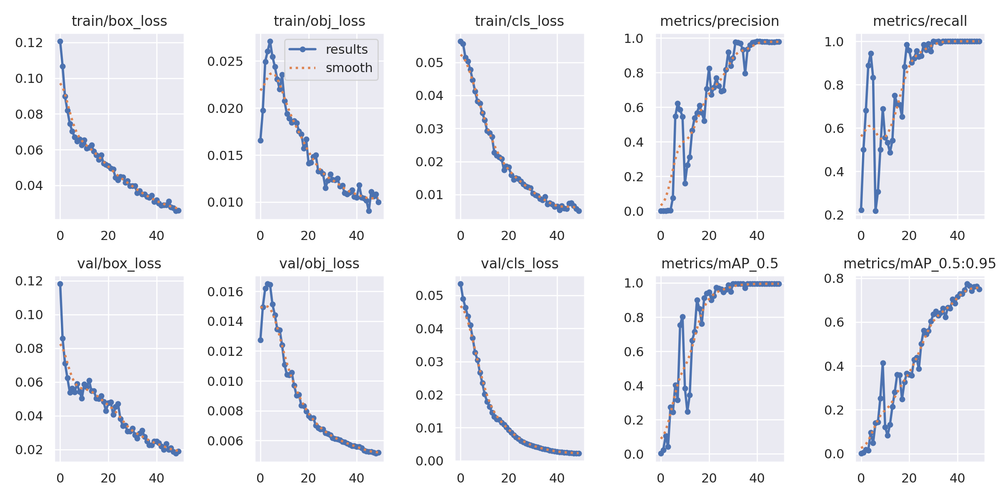

In [36]:
from utils.plots import plot_results
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)

GROUND TRUTH TRAINING DATA:


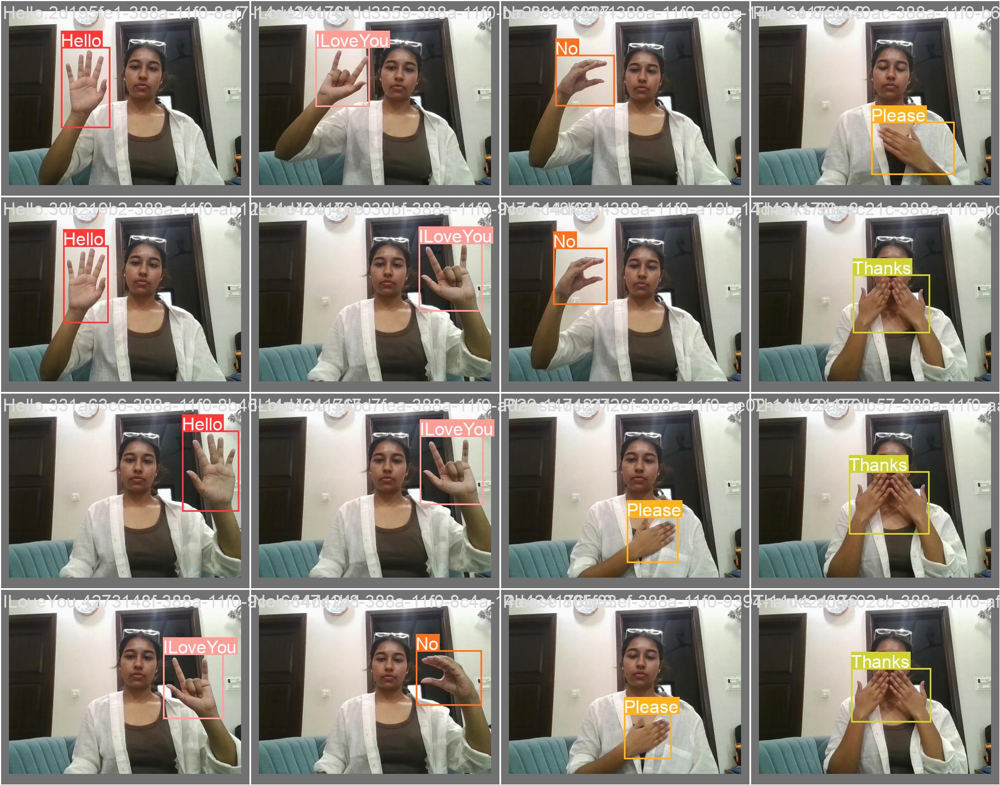

In [37]:
from IPython.display import Image, display

print("GROUND TRUTH TRAINING DATA:")
display(Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900))


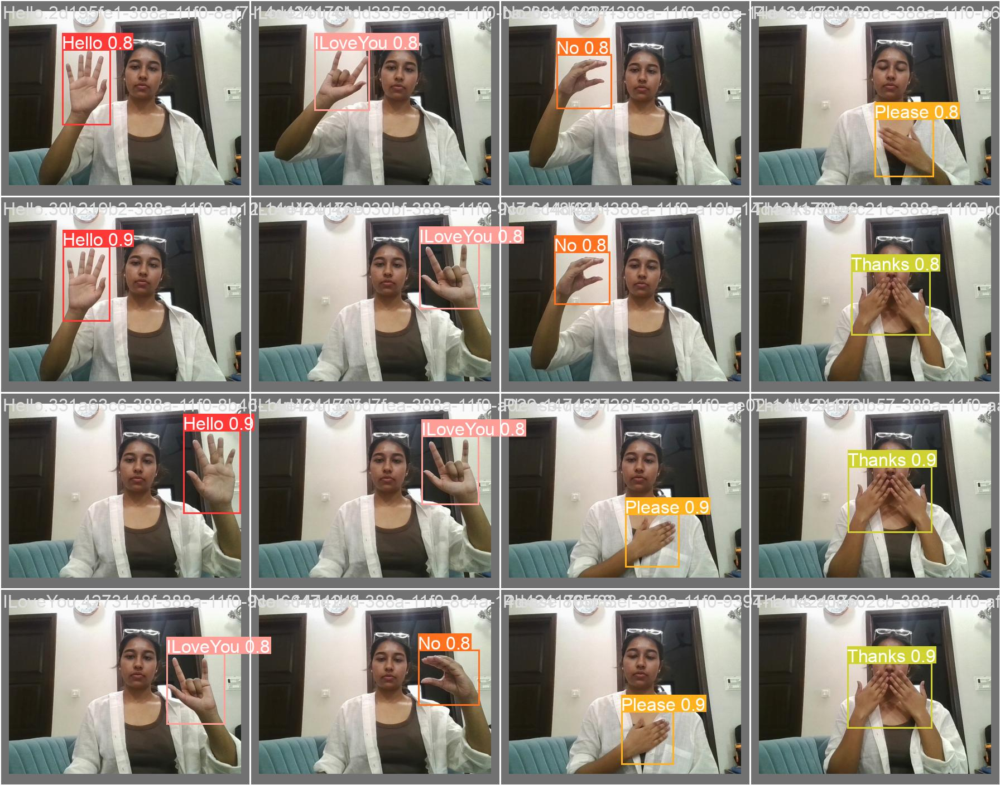

In [38]:
display(Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_pred.jpg', width=900))


GROUND TRUTH AUGMENTED TRAINING DATA:


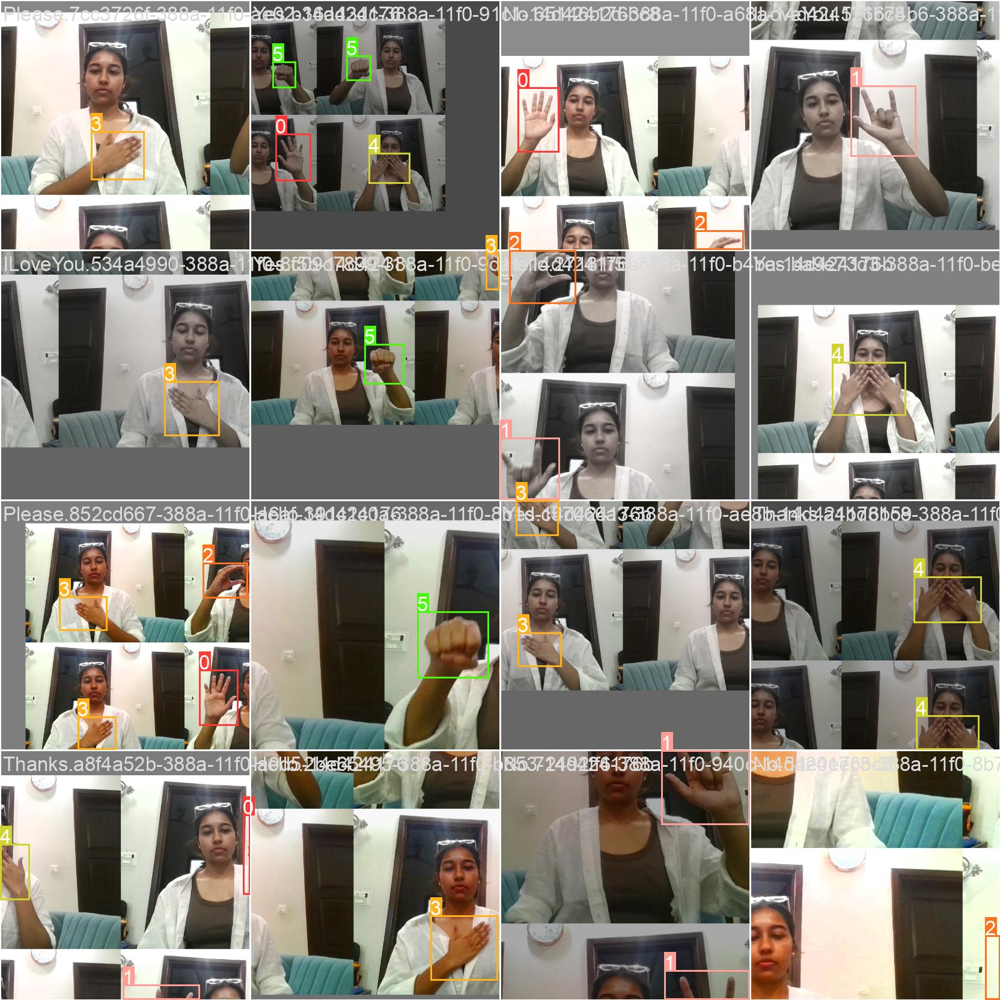

In [39]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

In [40]:
%ls runs/

train/


In [41]:

%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [42]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source /content/SignData/final_data/test/images


/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/SignData/final_data/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/20 /content/SignData/final_data/test/images/Hello.2d195fe1-388a-11f0-8af7-14d424176bc8.jpg: 320x416 1 Hello, 28.4ms
image 2/20 /content/SignData/final_data/test/images/Hello.30b219b2-388a-11f0-ab12-14d424176bc8.jpg: 320x416 1 Hello, 6.3ms
image 3/20

In [44]:
import glob
from IPython.display import Image, display

# Find all JPGs inside exp folders under /runs/detect
for imageName in glob.glob('/content/yolov5/runs/detect/exp*/**/*.jpg', recursive=True):
    display(Image(filename=imageName))
    print("\n")


Output hidden; open in https://colab.research.google.com to view.

In [46]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [47]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt "/content/gdrive/MyDrive/Colab Notebooks/best.pt"
